In [1]:
#%pip install hyperspectral_gta_data

In [2]:
# Common useful packages
import matplotlib.pyplot as plt
from matplotlib import colors
import numpy as np
import copy
import spectral

# module that is useful for reloading packages
import importlib

# Scripts associated with the SML4SI textbook
import hyperspectral_gta_data as hsi_data
import scripts_M2 as sm2

import KMeansTesting 
importlib.reload(KMeansTesting)


<module 'KMeansTesting' from 'c:\\Users\\wb8by\\Documents\\GitHub\\Machine-Learning-for-Spectral-Imaging\\Book Modules\\KMeansTesting.py'>

# Part 1: Open the image and load the data as a numpy array.

In [3]:
# To download and use the Washington DC image:
hsi_data.download('WashingtonDC')
fname = 'spectral_images/WashingtonDC_Ref_156bands/WashingtonDC_Ref_156bands'

# To download and use the polymers image:
# hsi_data.download('MicroscenePolymers')
# fname = 'Book Modules\spectral_images\Microscene_Polymers\reflectance_image_polymers

In [4]:
# Open the image and read into an array
im = spectral.envi.open(fname+'.hdr', fname)
wl = np.asarray(im.bands.centers)
# Load the image into memory
imArr = im.load()
print(f'Shape of ImArr = {imArr.shape}')

# To work with the data, we usually reshape the data from an image (# rows, # cols, # bands)
# into a standard (# observations, # features) array as (# pixels, # bands)
imList = np.reshape(imArr, (im.nrows*im.ncols, im.nbands))
print(f'Shape of imList = {imList.shape}')

Shape of ImArr = (1280, 307, 156)
Shape of imList = (392960, 156)


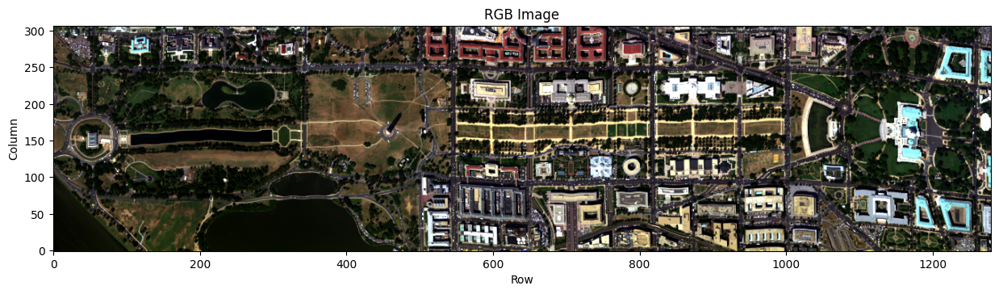

In [5]:
sm2.display_RGB(imArr, wl, rotate=True)
plt.title('RGB Image');

# PART 2: Viewing a scatterplot of the hyperspectral image.

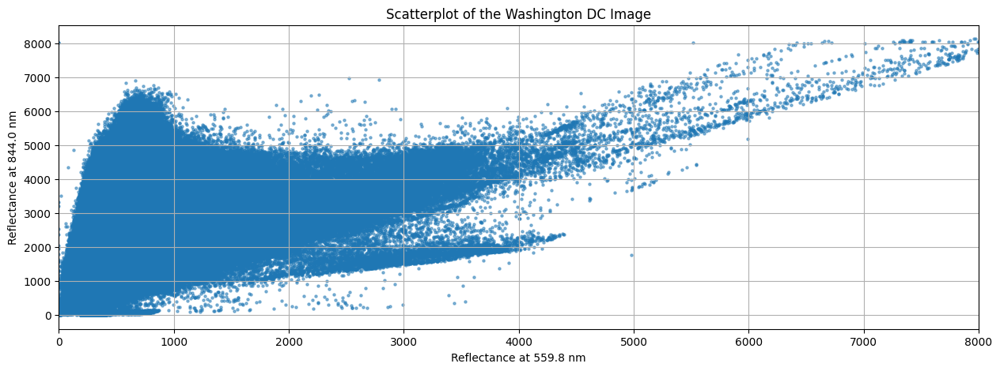

In [6]:
# Create a scatterplot of the data
i1 = 30
i2 = 60

plt.figure(figsize=(15,5))
plt.scatter(imList[:,i1], imList[:,i2], s=5, alpha=0.5);
plt.xlim(0,8000)
plt.grid(True)
plt.xlabel(f'Reflectance at {wl[i1]:.1f} nm')
plt.ylabel(f'Reflectance at {wl[i2]:.1f} nm')
plt.title('Scatterplot of the Washington DC Image');

In [7]:
def plot_results(class_index, class_image, k, dist_type):
    plt.figure(figsize=(15,15))
    
    # subplot with 2 rows, 1 columns, plotting to axis 1
    plt.subplot(2, 1, 1)
    colors = ['r','g','b','y', 'orange', 'cyan', 'magenta', 'lime', 'brown', 'deepskyblue']
    for i in range(k): 
        idx = np.where(class_index==i)
        S = np.squeeze(imList[idx,:])
        plt.scatter(S[:,i1], S[:,i2], c=colors[i], s=3, alpha=0.75, label=f'Class {i}');
    plt.xlim(0,8000)
    plt.grid(True)
    plt.xlabel(f'Reflectance at {wl[i1]:.1f} nm')
    plt.ylabel(f'Reflectance at {wl[i2]:.1f} nm')
    title = f'K-Means Scatterplot of Washington DC Image, k={k}, 10 iterations, and {dist_type} distance.'
    plt.title(title);
    plt.legend()
    
    # subplot with 2 rows, 1 columns, plotting to axis 2
    plt.subplot(2, 1, 2)
    title = f'K-Means Class Image of Washington DC Image, k={k}, 10 iterations, and {dist_type} distance.'
    plt.imshow(np.rot90(class_image), cmap='hsv')
    plt.title(title)
    
    plt.tight_layout()
    fname = f'KMeans, k={k}, distance={dist_type}.png'
    plt.savefig(fname)

# Part 3: Clustering using K-Means

Documentation on K Means clustering using sklearn in Python: https://scikit-learn.org/stable/modules/generated/sklearn.cluster.KMeans.html

A discussion of 11 clustering algorithms with Python implementations is provided in: https://scikit-learn.org/stable/modules/clustering.html

Running Kmeans, k=4, num_iterations=15, and using Euclidean distance.
Iteration =  0  1  2  3  4  5  6  7  8  9  10  11  12  13  14  
Running Kmeans, k=4, num_iterations=15, and using Correlation distance.
Iteration =  0  1  2  3  4  5  6  7  8  9  10  11  12  13  14  
Running Kmeans, k=5, num_iterations=15, and using Euclidean distance.
Iteration =  0  1  2  3  4  5  6  7  8  9  10  11  12  13  14  
Running Kmeans, k=5, num_iterations=15, and using Correlation distance.
Iteration =  0  1  2  3  4  5  6  7  8  9  10  11  12  13  14  
Running Kmeans, k=6, num_iterations=15, and using Euclidean distance.
Iteration =  0  1 

C:\Users\wb8by\AppData\Roaming\Python\Python311\site-packages\numpy\core\fromnumeric.py:3504: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
C:\Users\wb8by\AppData\Roaming\Python\Python311\site-packages\numpy\core\_methods.py:121: RuntimeWarning: invalid value encountered in divide
  ret = um.true_divide(


 2  3  4  5  6  7  8  9  10  11  12  13  14  
Running Kmeans, k=6, num_iterations=15, and using Correlation distance.
Iteration =  0  1  2  3  4  5  6  7  8  9  10  11  12  13  14  
Running Kmeans, k=8, num_iterations=15, and using Euclidean distance.
Iteration =  0  1  2  3  4  5  6  7  8  9  10  11  12  13  14  
Running Kmeans, k=8, num_iterations=15, and using Correlation distance.
Iteration =  0  1  2  3  4  5  6  7  8  9  10  11  12  13  14  
Running Kmeans, k=9, num_iterations=15, and using Euclidean distance.
Iteration =  0  1  2  3  4  5  6  7  8  9  10  11  12  13  14  
Running Kmeans, k=9, num_iterations=15, and using Correlation distance.
Iteration =  0  1  2  3  4  5  6  7  8  9  10  11  12  13  14  
Running Kmeans, k=10, num_iterations=15, and using Euclidean distance.
Iteration =  0  1  2  3  4  5  6  7  8  9  10  11  12  13  14  
Running Kmeans, k=10, num_iterations=15, and using Correlation distance.
Iteration =  0  1  2  3  4  5  6  7  8  9  10  11  12  13  14  


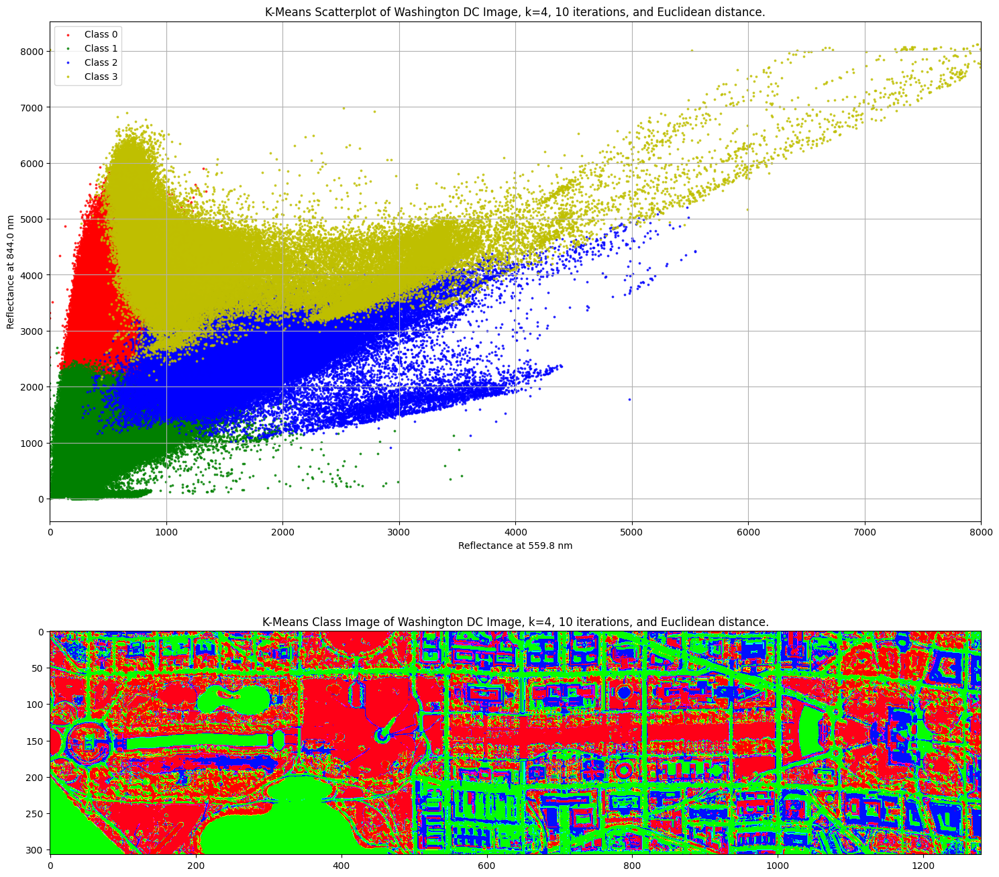

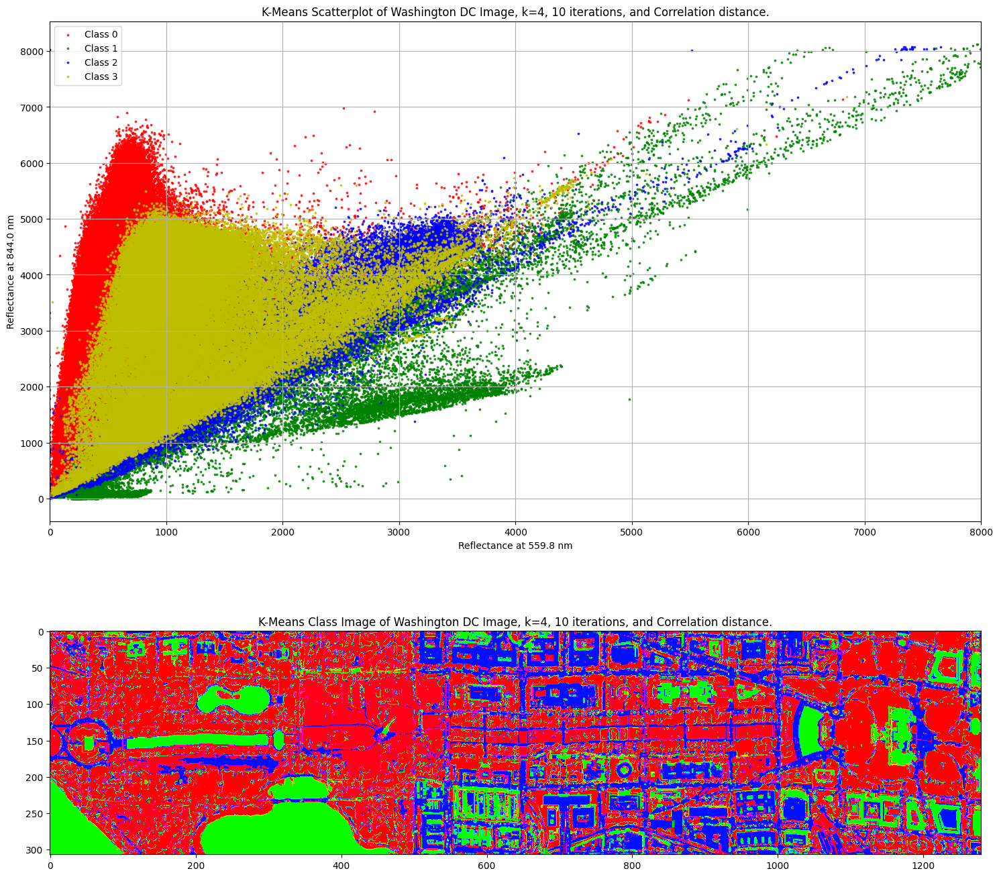

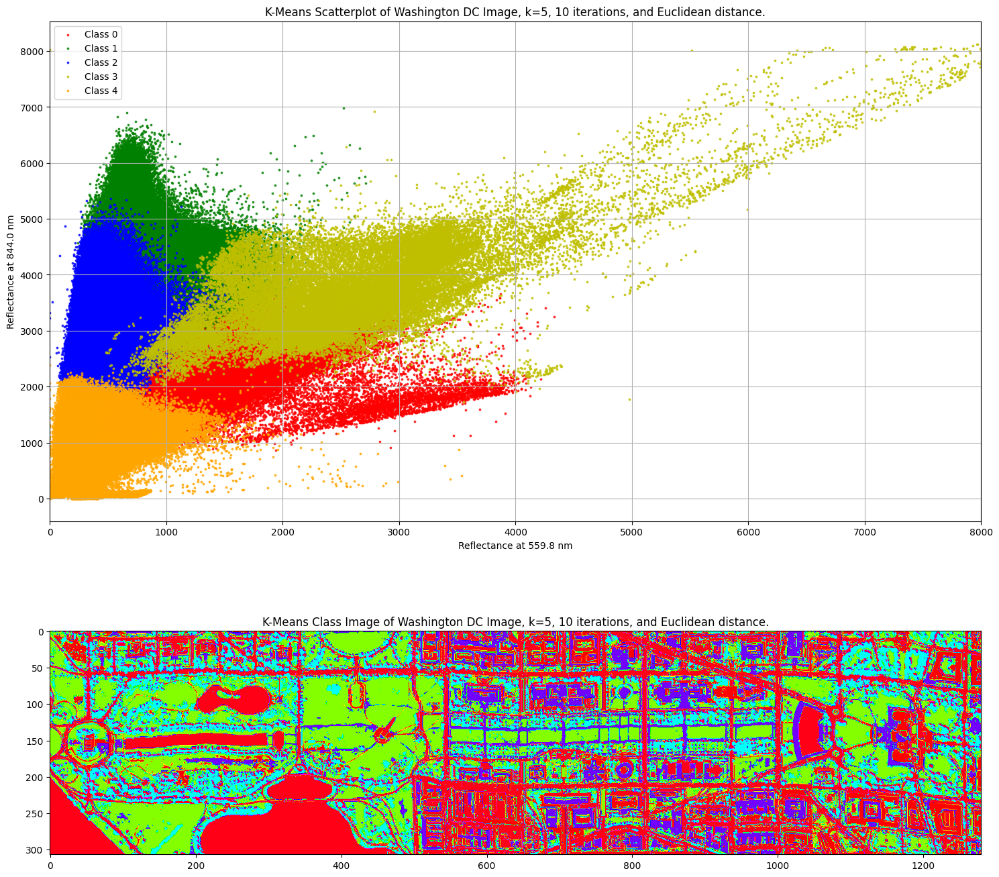

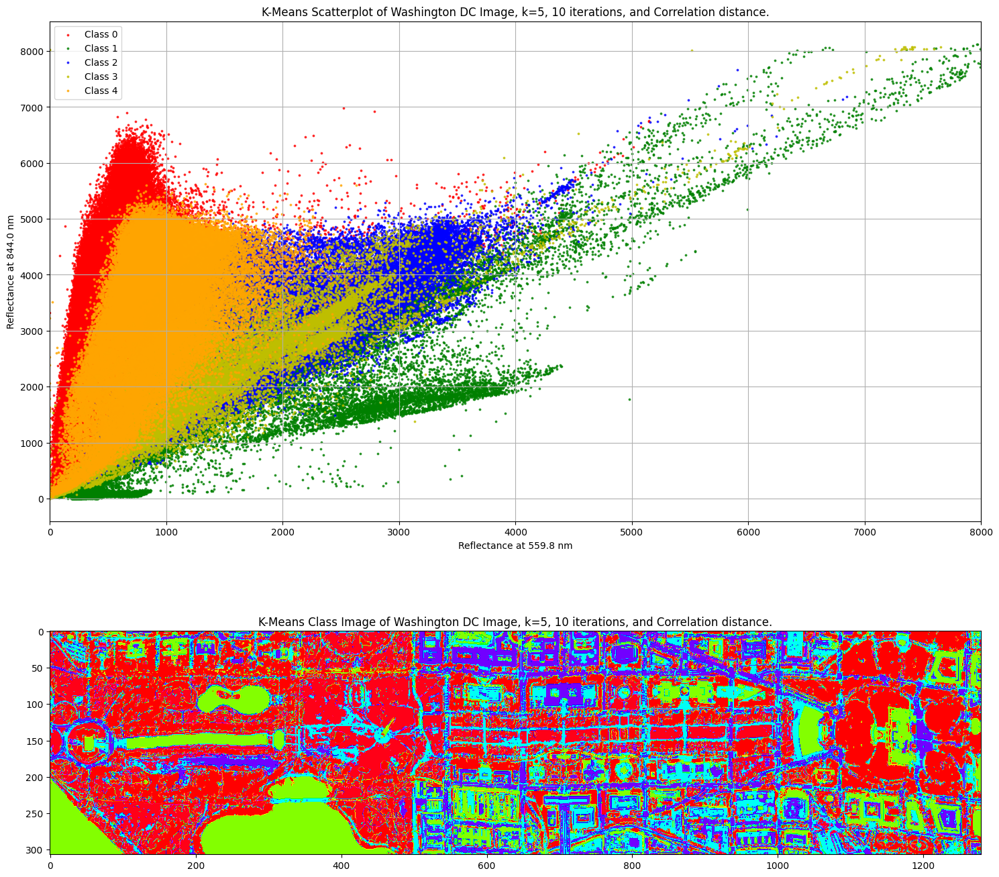

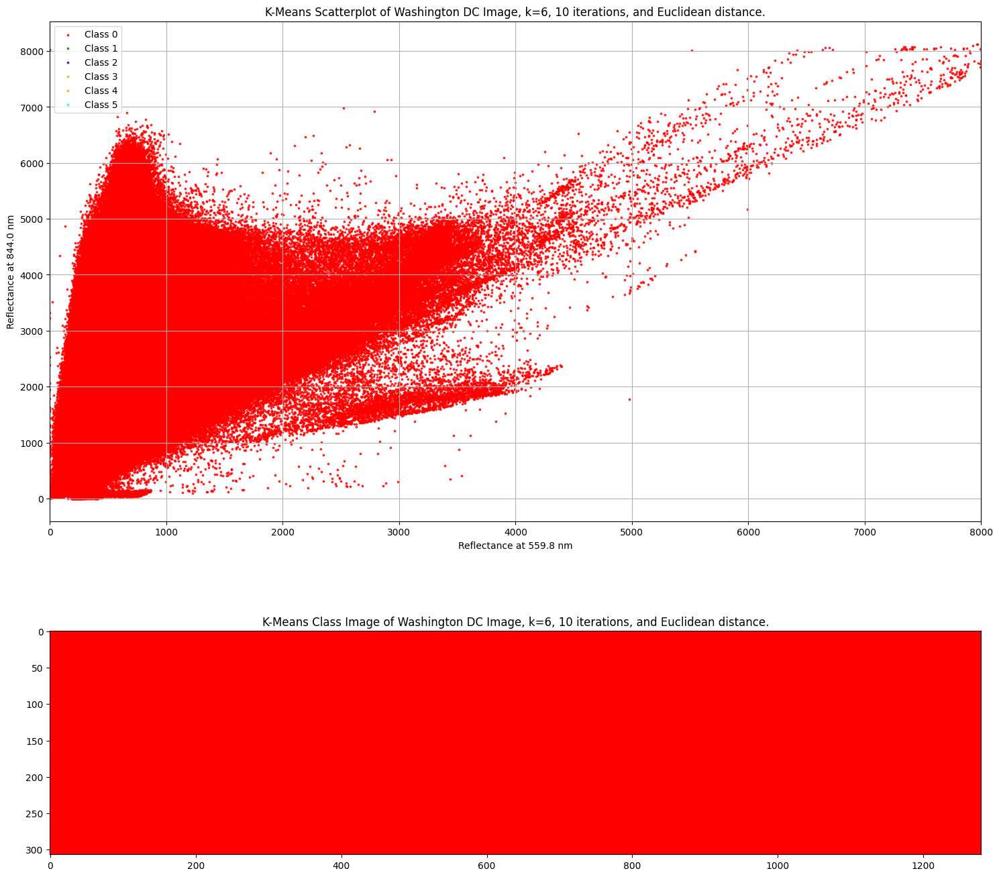

...

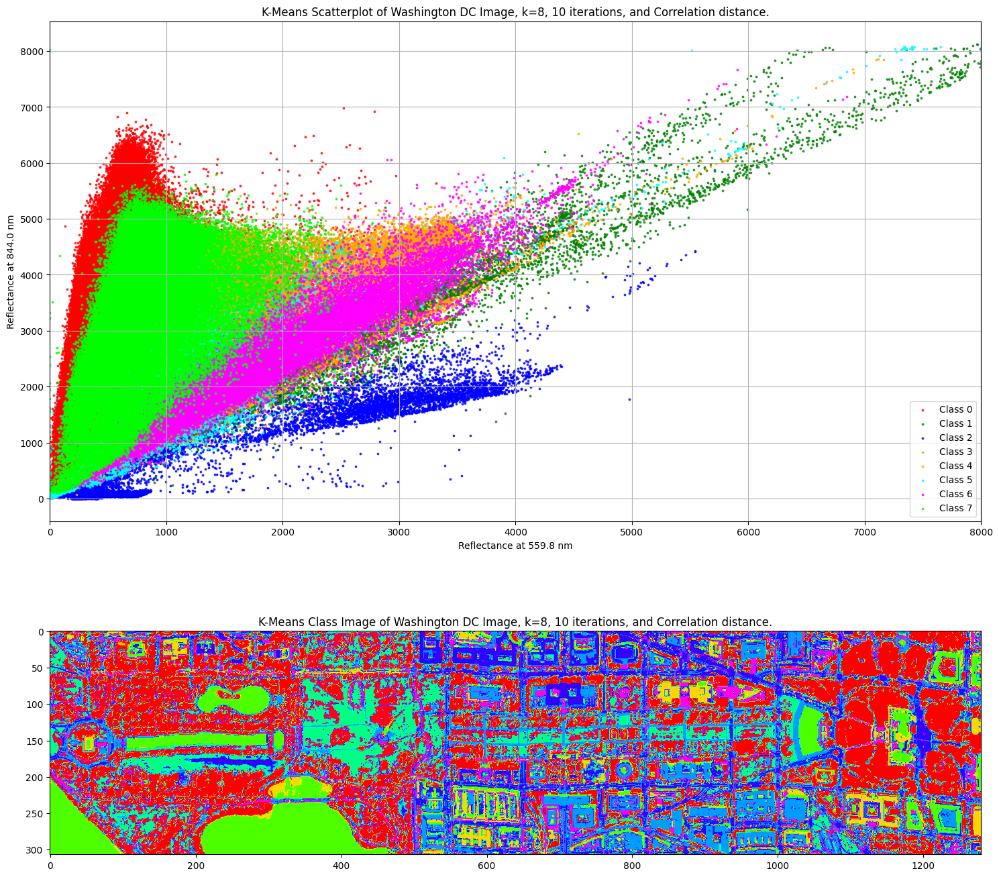

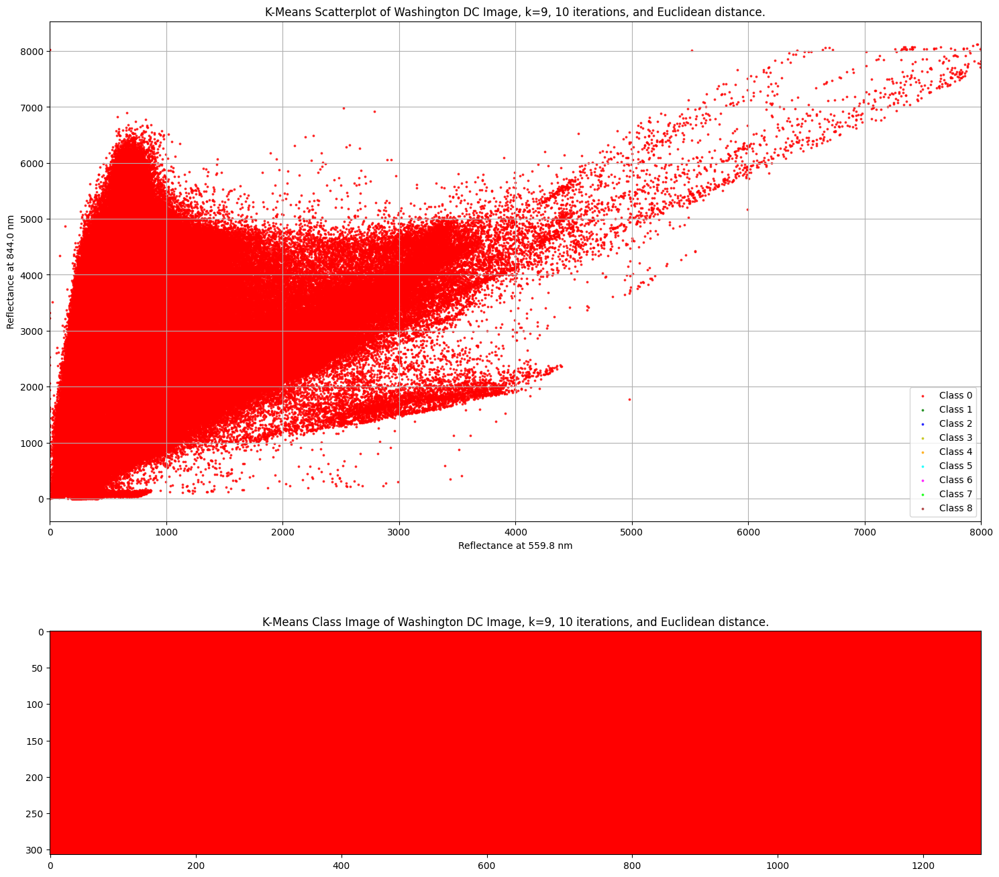

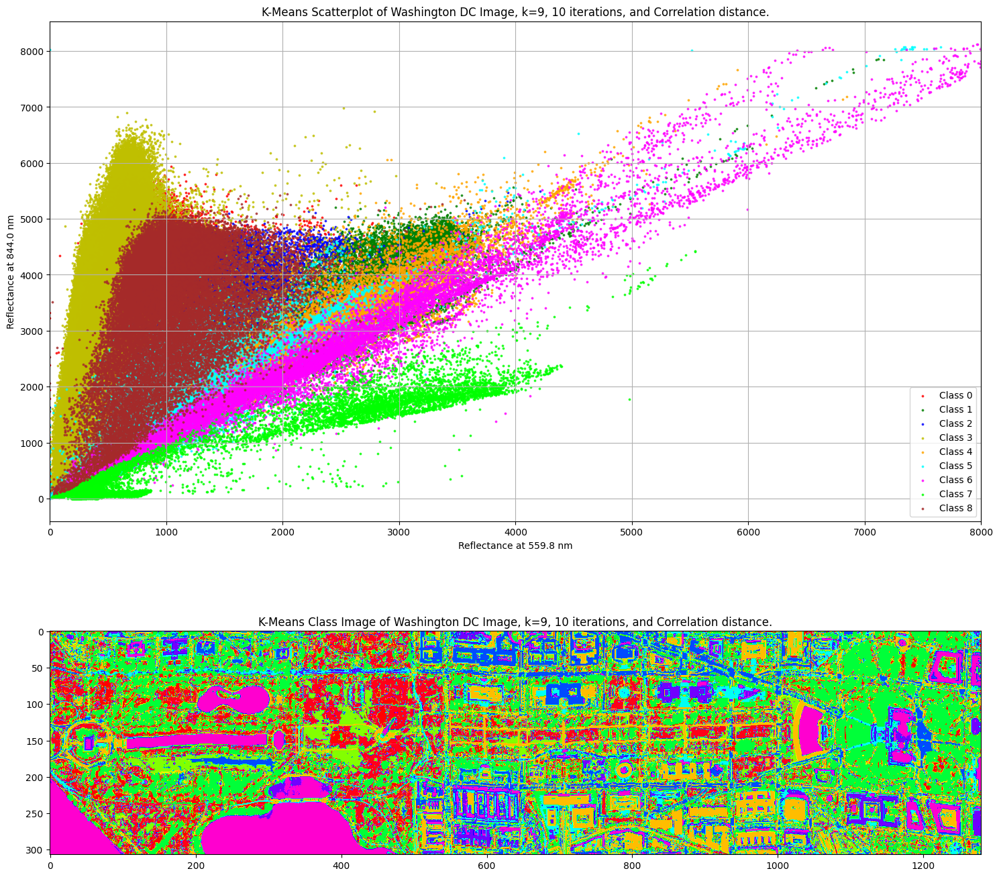

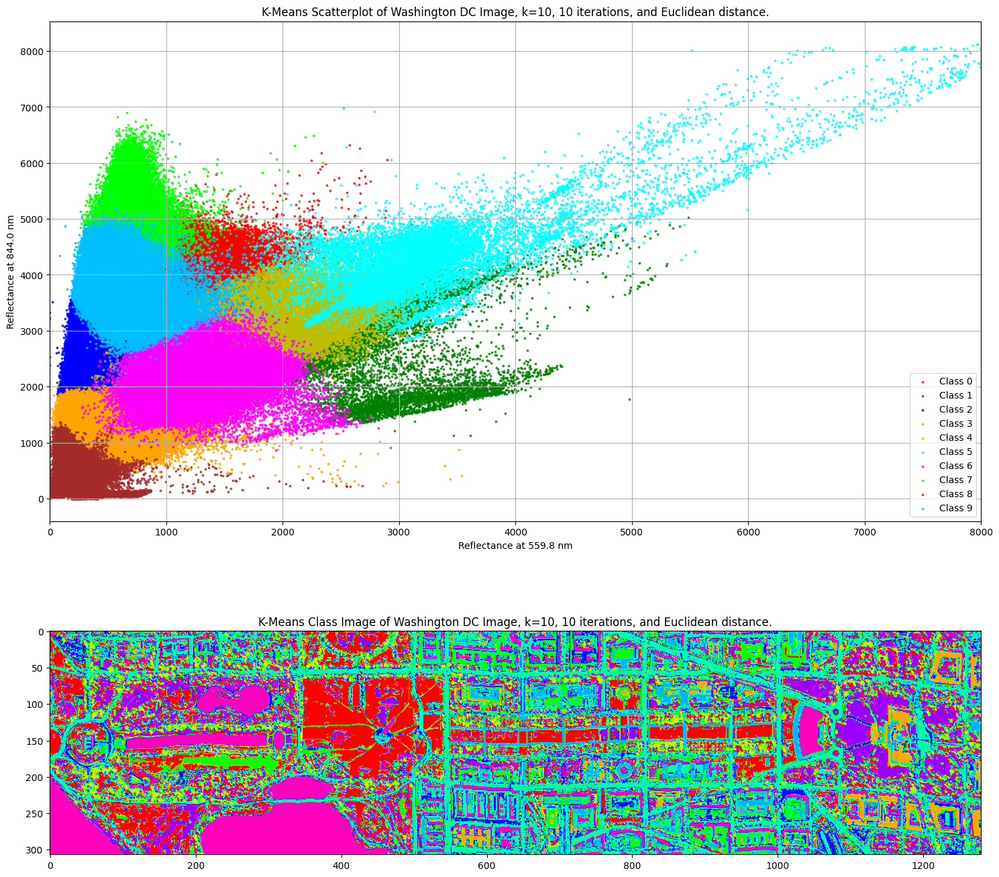

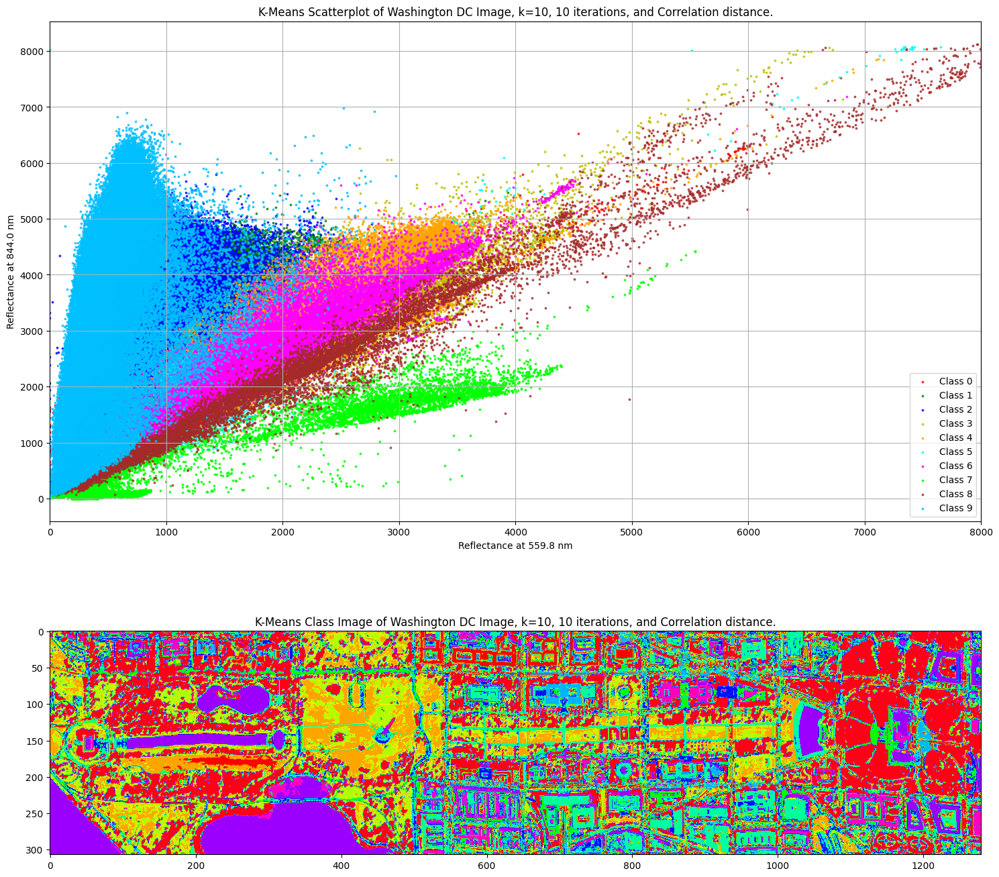

In [8]:
for k in [4,5,6,8,9,10]:
    for dist_type in ['Euclidean', 'Correlation']:
        class_index, class_image = KMeansTesting.KMeans(imArr, k, dist_type=dist_type)
        plot_results(class_index, class_image, k, dist_type)